In [ ]:
%tensorflow_version 2.x

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


# **1. Importer les bibliothèques requises**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import *
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import numpy as np
from glob import glob
import os
import datetime
from glob import glob
import IPython.display as display
from IPython.display import clear_output
from google.colab import files
import math
import time
import warnings
warnings.filterwarnings('ignore')
AUTOTUNE = tf.data.experimental.AUTOTUNE
print(f'Tensorflow ver. {tf.__version__}')

Tensorflow ver. 2.13.0


# **Spécifier le chemin de chaque répertoire de la base de données**

In [ ]:
# important for reproducibility
# this allows to generate the same random numbers
SEED = 42

# Dataset path
# Images and masks train
dataset_path = '/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/'
img_train = dataset_path + 'original_images/original_images/train/'
seg_train = dataset_path + 'mask_images/mask_images/train/'

# Images and masks test
img_val = dataset_path + 'original_images/original_images/test/'
seg_val = dataset_path + 'mask_images/mask_images/test/'

# **Définir le taille des images et masques, le nombre de cannaux ainsi que le nombre de classes**

In [ ]:
# Image size that we are going to use
(HEIGHT,WIDTH) = (128,128)
# Our images are RGB (3 channels)
N_CHANNELS = 3
# Number of classes
N_CLASSES = 76

# **Le nombre d'images dans le trainset et testset**

In [ ]:

TRAINSET_SIZE = len(glob(img_train+'*/*.jpg'))
print(f"The Training Dataset contains {TRAINSET_SIZE} images.")

VALSET_SIZE = len(glob(img_val+'*/*.jpg'))
print(f"The Validation Dataset contains {VALSET_SIZE} images.")

The Training Dataset contains 451 images.
The Validation Dataset contains 52 images.


# **Charger une image et son annotation (masque) et renvoyer un dictionnaire.**

In [ ]:
def parse_image(img_path):
    """
    Load an image and its annotation (mask) and returning a dictionary.
    """
    # Reading the image
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image,channels=3)
    # For one Image path:
    # .../idd20k_lite/leftImg8bit/train/024541_image.jpg
    # Its corresponding annotation path is:
    # .../idd20k_lite/gtFine/train/024541_label.png
    mask_path = tf.strings.regex_replace(img_path, "original_images", "mask_images")
    mask_path = tf.strings.regex_replace(mask_path, ".jpg","_label.png")
    # Reading the annotation file corresponding the image file
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask,channels=1)
    return {'image': image, 'segmentation_mask': mask}

# **Ce code charge des images et leurs annotations à partir de répertoires spécifiques, les traite à l'aide de la fonction parse_image, et crée deux ensembles de données TensorFlow (train_dataset et val_dataset) pour l'entraînement et la validation.**

In [ ]:
# Reference -> https://www.tensorflow.org/api_docs/python/tf/data/Dataset#list_files
# tf.data.Dataset.list_files returns a dataset of all files matching one or more glob patterns.

train_dataset = tf.data.Dataset.list_files(img_train+'*/*.jpg', seed=SEED)
train_dataset = train_dataset.map(parse_image)
print('La taille du train_dataset:', len((train_dataset)))

val_dataset = tf.data.Dataset.list_files(img_val+'*/*.jpg', seed=SEED)
val_dataset =val_dataset.map(parse_image)
print('La taille du val_dataset:', len((val_dataset)))

La taille du train_dataset: 451
La taille du val_dataset: 52


# **Normaliser les valeurs des pixels des images entre 0 et 1.**

In [ ]:
# Reference -> https://www.tensorflow.org/api_docs/python/tf/cast
# Returns a Tensor same shape as given tensor and same type as dtype that is mentioned.

def normalize(input_image, input_mask):
    """
    Rescale the pixel values of the images between 0 and 1 compared to [0,255] originally.
    """
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

# **Redimensionner les images à la taille spécifiée.**

In [ ]:
# Reference -> https://www.tensorflow.org/api_docs/python/tf/image/resize
# Resize images to the size specified

def load_image_train(datapoint):
    """
    Normalize and resize a train image and its annotation.
    Apply random transformations to an input dictionary containing a train image and its annotation.
    """
    input_image = tf.image.resize(datapoint['image'], (HEIGHT,WIDTH))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (HEIGHT,WIDTH))
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

def load_image_test(datapoint):
    """
    Normalize and resize a test image and its annotation.
    Since this is for the test set, we don't need to apply any data augmentation technique.
    """
    input_image = tf.image.resize(datapoint['image'], (HEIGHT,WIDTH))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (HEIGHT,WIDTH))
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

# **Définir une valeur du BATCH_SIZE, BUFFER_SIZE et un dictionnaire dataset contenant notre train_dataset et notre val_dataset.**

In [ ]:
BATCH_SIZE = 16
BUFFER_SIZE = 1500
dataset = {"train": train_dataset, "val": val_dataset}

# **Préparation de l'ensemble de données d'entraînement et validation en appliquant des transformations.**

In [ ]:
# Reference -> https://www.tensorflow.org/api_docs/python/tf/data/Dataset

# Preparing the Train dataset by applying dataset transformations
dataset['train'] = dataset['train'].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset['train'] = dataset['train'].shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset['train'] = dataset['train'].repeat()
dataset['train'] = dataset['train'].batch(BATCH_SIZE)
dataset['train'] = dataset['train'].prefetch(buffer_size=AUTOTUNE)
print(dataset['train'])
#
## Preparing the Validation Dataset
dataset['val'] = dataset['val'].map(load_image_test)
dataset['val'] = dataset['val'].repeat()
dataset['val'] = dataset['val'].batch(BATCH_SIZE)
dataset['val'] = dataset['val'].prefetch(buffer_size=AUTOTUNE)
print(dataset['val'])

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>


# **Afficher côte à côte une image d'entrée, la vérité terrain et la prédiction.**

In [ ]:
def display_sample(display_list):
    """
    Show side-by-side an input image,
    the ground truth and the prediction.
    """
    plt.figure(figsize=(15,15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [ ]:
# Getting a sample image for visualizing
for image, mask in dataset['train'].take(1):
    sample_image, sample_mask = image, mask

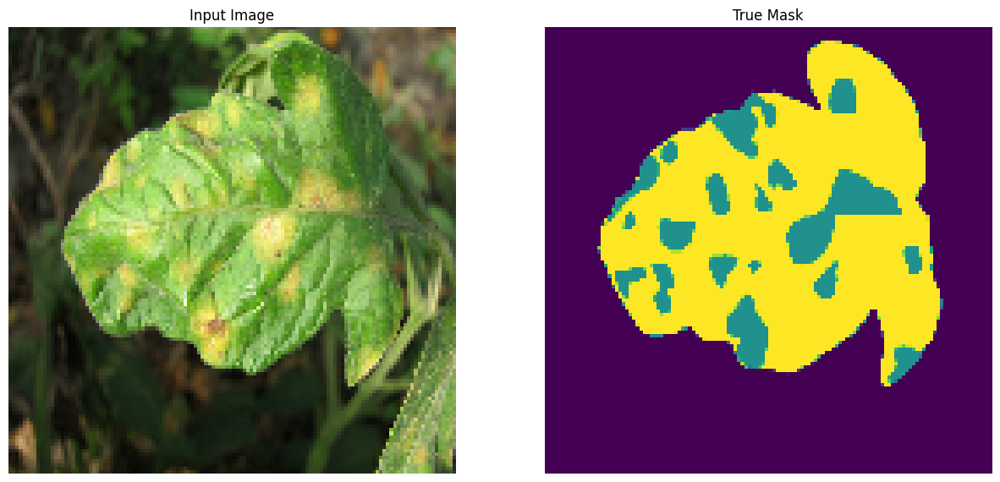

In [ ]:
# Displaying a sample Input Image and its corresponding mask
display_sample([sample_image[0], sample_mask[0]])

# **Définition du modèle PSPNet**

In [ ]:
# A class to get the basic convolution block
# convolution_layer -> batch_normalization -> activation
class BasicConvolutionBlock(tf.keras.Model):

    def __init__(self, filter_size, kernel_size, dilation_rate, alpha, block_number, initializer='he_normal'):
        super(BasicConvolutionBlock, self).__init__()
        # block_number variable is used to keep a track of blocks as the structure changes slightly for 3rd and 4th block
        self.block_number = block_number
        # defining a convolution layer
        self.convolution_layer = Convolution2D(filter_size, kernel_size =  kernel_size,
                                               dilation_rate = dilation_rate, padding = 'same',
                                               kernel_initializer = initializer)
        # defining a batch normalization layer
        self.batch_normalization = BatchNormalization()
        # defining a LeakyReLU activation layer
        self.activation = LeakyReLU(alpha = alpha)

    def call(self, inputs):
        # getting the convolution output
        conv_output = self.convolution_layer(inputs)
        # normalizaing the convolution output
        norm_output = self.batch_normalization(conv_output)
        # for 3rd block and 4th block, we return the normalized output without activation layer
        if(self.block_number >= 3):
            return norm_output
        # Passing the normalized output through LeakyReLU
        activation_output = self.activation(norm_output)
        return activation_output

In [ ]:
# A Building Block of Residual Network
class ConvolutionBlock(tf.keras.Model):

    def __init__(self, filters, initializer='he_normal'):
        super(ConvolutionBlock, self).__init__()
        # The filters will be a list with 3 filter sizes (eg. [32,32,64]) where each filter size
        # will be passed to a BasicConvolutionBlock
        self.filters = filters
        # Defining basic convolution blocks for each filter size
        self.basic_convolution_1 = BasicConvolutionBlock(self.filters[0], (1,1), (1,1), 0.2, 1)
        self.basic_convolution_2 = BasicConvolutionBlock(self.filters[1], (3,3), (2,2), 0.2, 2)
        self.basic_convolution_3 = BasicConvolutionBlock(self.filters[2], (1,1), (1,1), 0.2, 3)
        # Defining the skip connection that is used in Residual BLocks
        self.skip_convolution = BasicConvolutionBlock(self.filters[2], (3,3), (1,1), 0.2, 4)
        # Last Block
        self.add_layer = Add()
        self.relu_activation = ReLU()

    def call(self, inputs):
        # Getting the skip input
        skip_input = inputs
        # Getting the convolution outputs from BasicConvolutionBlocks
        output_conv_1 = self.basic_convolution_1(inputs)
        output_conv_2 = self.basic_convolution_2(output_conv_1)
        output_conv_3 = self.basic_convolution_3(output_conv_2)
        output_skip_conv = self.skip_convolution(skip_input)
        # Last Block
        # Adding the skip connection output and output of last convolution block
        add_output = self.add_layer([output_conv_3,output_skip_conv])
        # Passing the added output through ReLU activation
        output = self.relu_activation(add_output)
        return output

In [ ]:
# Encoder block for PSPNet
class EncoderBlock(tf.keras.Model):

    def __init__(self, filters):
        super(EncoderBlock, self).__init__()
        # filters -> [[32,32,64],[64,64,128],[128,128,256],[256,256,512]]
        # Each sublist in the abover filters list will be passed to ConvolutionBlocks
        # and every single element in the sublist will be further passed to BasicConvolutionBlock
        self.filters = filters
        # Defining the convolution blocks
        self.convolution_block_1 = ConvolutionBlock(self.filters[0])
        self.convolution_block_2 = ConvolutionBlock(self.filters[1])
        self.convolution_block_3 = ConvolutionBlock(self.filters[2])
        self.convolution_block_4 = ConvolutionBlock(self.filters[3])

    def call(self, inputs):
        # Passing the inputs to the Convolution Block defined above
        output_block_1 = self.convolution_block_1(inputs)
        # Passing the output of convolution blocks to futher convolution blocks
        output_block_2 = self.convolution_block_2(output_block_1)
        output_block_3 = self.convolution_block_3(output_block_2)
        output_block_4 = self.convolution_block_4(output_block_3)
        return output_block_4

In [ ]:
# This class returns the pyramid feature map for Pyramid Pooling module
# Pooling -> Convolution -> UpSampling
class PyramidFeatureMap(tf.keras.Model):

    def __init__(self, block, filter_size, unsampling_size, pool_size, interpolation='bilinear'):
        super(PyramidFeatureMap, self).__init__()
        # There are 4 blocks -> red, yellow, blue, green
        # As the pooling technique is different for Red block, defining a block will help
        # to keep a track of the changes that are required for different blocks
        self.block = block
        # Defining the convolution layer
        self.convolution_layer = Convolution2D(filter_size, kernel_size = (1,1))
        # Defining the UpSampling layer
        self.upsampling_layer = UpSampling2D(unsampling_size, interpolation = interpolation)
        # Defining the average pooling layer that is going to be used for yellow, blue and green
        self.average_pooling = AveragePooling2D(pool_size)
        # Defining a global average pooling layer for red block
        self.global_average_pooling = GlobalAveragePooling2D()

    def call(self,inputs):
        # For Red block, we will pass the input through GlobalAveragePooling layer
        if(self.block=='red'):
            pool_output = self.global_average_pooling(inputs)
            pool_output = Reshape((1,1,512))(pool_output)
        # For all the other blocks, we will perform AveragePooling
        else:
            pool_output = self.average_pooling(inputs)
        # Passing the pooled output through convolution layer
        conv_output = self.convolution_layer(pool_output)
        # Passing the convolution output through UpSampling layer
        upsampling_output = self.upsampling_layer(conv_output)
        return upsampling_output

In [ ]:
# This class builds the Pyramid Pooling Module
# It builds the 4 feature maps and then concatenates all of them with the input
class PyramidPoolingModule(tf.keras.Model):

    def __init__(self):
        super(PyramidPoolingModule, self).__init__()
        # Defining the PyramidFeatureMaps for red, yellow, blue and green blocks along with the
        # filter_size, unsampling_size and pool_size
        self.block_red = PyramidFeatureMap('red', 64, (128,128), (1,1))
        self.block_yellow = PyramidFeatureMap('yellow', 64, 2, (2,2))
        self.block_blue = PyramidFeatureMap('blue', 64, 4, (4,4))
        self.block_green = PyramidFeatureMap('green', 64, 8, (8,8))

    def call(self,inputs):
        # Passing the inputs through each of the blocks
        red_output = self.block_red(inputs)
        yellow_output = self.block_yellow(inputs)
        blue_output = self.block_blue(inputs)
        green_output = self.block_green(inputs)
        # Concatenating the inputs with the outputs of each of the PyramidFeatureMaps
        merged = concatenate([inputs, red_output, yellow_output, blue_output, green_output])
        return merged

In [ ]:
# This block is for the last stage
# It gets the output of Pyramid Pooling Module and then performs convolution operation
# Pyramid Pooling Module -> Convolution -> Batch Normalization -> Softmax activation
class DecoderBlock(tf.keras.Model):

    def __init__(self, num_classes):
        super(DecoderBlock, self).__init__()
        # Defining the PyramidPoolingModule
        self.pyramid_pooling_module = PyramidPoolingModule()
        # Defining the Convolution Layer with filter size as number of classes
        self.convolution_layer = Convolution2D(num_classes, kernel_size = (3,3), padding = 'same')
        # Defining the BatchNormalization layer
        self.batch_norm_layer = BatchNormalization()
        # Defining the last softmax activation layer
        self.activation = Activation('softmax')

    def call(self, inputs):
        # Getting the PyramidPoolingModule output
        merged = self.pyramid_pooling_module(inputs)
        # Passing the PyramidPoolingModule output to ConvolutionLayer
        conv_output = self.convolution_layer(merged)
        # Passing the convolution output to BatchNormalization layer
        norm_output = self.batch_norm_layer(conv_output)
        # Passing the normalized output through activation layer
        output = self.activation(norm_output)
        return output

In [ ]:
#This final class for the Model
class PSPNetModel(tf.keras.Model):

    def __init__(self, num_classes):
        super(PSPNetModel, self).__init__()
        # Defining the Encoder block with lists of filter sizes for ConvolutionBlocks
        self.encoder = EncoderBlock([[32,32,64],[64,64,128],[128,128,256],[256,256,512]])
        # Defining the Decoder blocks
        self.decoder = DecoderBlock(num_classes)

    def call(self, inputs):
        # Passing the inputs through Encoder Blocks
        encoder_output = self.encoder(inputs)
        # Passing the encoder output through decoder block
        final_output = self.decoder(encoder_output)
        return final_output

In [ ]:
from tensorflow.keras.layers import *
# SegmentationModel object
model = PSPNetModel(N_CLASSES)

In [ ]:
#Summury
input_shape = (None,128,128,3)
model.build(input_shape) # `input_shape` is the shape of the input data
                         # e.g. input_shape = (None, 128, 128, 3)
model.summary()

Model: "psp_net_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_block (EncoderBloc  multiple                  2607968   
 k)                                                              
                                                                 
 decoder_block (DecoderBloc  multiple                  657020    
 k)                                                              
                                                                 
Total params: 3264988 (12.45 MB)
Trainable params: 3259076 (12.43 MB)
Non-trainable params: 5912 (23.09 KB)
_________________________________________________________________


# **Définition d'une fonction de perte et d'un optimiseur.**

In [ ]:
# Defining a loss object and an optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()
optimizer = tf.keras.optimizers.Adam()
ckpt = tf.train.Checkpoint(step=tf.Variable(1), optimizer=optimizer, net=model)
manager = tf.train.CheckpointManager(ckpt, 'tf_ckpts/', max_to_keep=3)

# **Définition des métriques.**

In [ ]:
# Define the metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')
test_loss = tf.keras.metrics.Mean('test_loss', dtype=tf.float32)
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('test_accuracy')

# **Redéfinir les fonctions train_step, train_and_checkpoint, test_step de tensorflow.**

In [ ]:
@tf.function
def train_step(model, optimizer, x_train, y_train):
    with tf.GradientTape() as tape:
        predictions = model(x_train, training=True)
        loss = loss_object(y_train, predictions)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    train_loss(loss)
    train_accuracy(y_train, predictions)

def train_and_checkpoint(model, manager, dataset, epoch):
    ckpt.restore(manager.latest_checkpoint)
    if manager.latest_checkpoint:
        print("Restored from {}".format(manager.latest_checkpoint))
    else:
        print("Initializing from scratch.")
    for (x_train, y_train) in dataset['train'].take(math.ceil(451/3)):
        train_step(model, optimizer, x_train, y_train)
    ckpt.step.assign_add(1)
    save_path = manager.save()
    print("Saved checkpoint for epoch {}: {}".format(epoch, save_path))

@tf.function
def test_step(model, x_test, y_test):
    predictions = model(x_test)
    loss = loss_object(y_test, predictions)
    test_loss(loss)
    test_accuracy(y_test, predictions)
    return predictions

In [ ]:
train_log_dir = 'logs/gradient_tape/train'
test_log_dir = 'logs/gradient_tape/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

# **Lancement de l'entrainement de notre modèle PSPNet**

In [ ]:
# This variable will help to save the best model if its performance increases after an epoch
highest_accuracy = 0

# Training the model for 30 epochs
for epoch in range(30):

    print("Epoch ",epoch+1)

    # Getting the current time before starting the training
    # This will help to keep track of how much time an epoch took
    start = time.time()

    train_and_checkpoint(model, manager, dataset, epoch+1)

    # Saving the train loss and train accuracy metric for TensorBoard visualization
    with train_summary_writer.as_default():
        tf.summary.scalar('loss', train_loss.result(), step=ckpt.step.numpy())
        tf.summary.scalar('accuracy', train_accuracy.result(), step=ckpt.step.numpy())

    # Validation phase
    for (x_test, y_test) in dataset['val'].take(math.ceil(52)):
        pred = test_step(model, x_test, y_test)

    # Saving the validation loss and validation accuracy metric for Tensorboard visualization
    with test_summary_writer.as_default():
        tf.summary.scalar('loss', test_loss.result(), step=ckpt.step.numpy())
        tf.summary.scalar('accuracy', test_accuracy.result(), step=ckpt.step.numpy())

    # Calculating the time it took for the entire epoch to run
    print("Time taken ",time.time()-start)

    # Printing the metrics for the epoch
    template = 'Epoch {}, Loss: {:.3f}, Accuracy: {:.3f}, Val Loss: {:.3f}, Val Accuracy: {:.3f}'
    print (template.format(epoch+1,
                            train_loss.result(),
                            train_accuracy.result()*100,
                            test_loss.result(),
                            test_accuracy.result()*100))

    # If accuracy has increased in this epoch, updating the highest accuracy and saving the model
    if(test_accuracy.result().numpy()*100>highest_accuracy):
        print("Validation accuracy increased from {:.3f} to {:.3f}. Saving model weights.".format(highest_accuracy,test_accuracy.result().numpy()*100))
        highest_accuracy = test_accuracy.result().numpy()*100
        model.save_weights('pspnet_weights-epoch-{}.hdf5'.format(epoch+1))

    print('_'*80)

    # Reset metrics after every epoch
    train_loss.reset_states()
    test_loss.reset_states()
    train_accuracy.reset_states()
    test_accuracy.reset_states()

Epoch  1
Initializing from scratch.
Saved checkpoint for epoch 1: tf_ckpts/ckpt-1
Time taken  265.017450094223
Epoch 1, Loss: 3.608, Accuracy: 54.772, Val Loss: 5.126, Val Accuracy: 37.064
Validation accuracy increased from 0.000 to 37.064. Saving model weights.
________________________________________________________________________________
Epoch  2
Restored from tf_ckpts/ckpt-1
Saved checkpoint for epoch 2: tf_ckpts/ckpt-2
Time taken  191.2806282043457
Epoch 2, Loss: 3.081, Accuracy: 68.116, Val Loss: 2.613, Val Accuracy: 75.356
Validation accuracy increased from 37.064 to 75.356. Saving model weights.
________________________________________________________________________________
Epoch  3
Restored from tf_ckpts/ckpt-2
Saved checkpoint for epoch 3: tf_ckpts/ckpt-3
Time taken  193.36892199516296
Epoch 3, Loss: 2.678, Accuracy: 70.805, Val Loss: 2.464, Val Accuracy: 72.080
________________________________________________________________________________
Epoch  4
Restored from tf_ckpts/

# **Prédire pour une image donné sa segmentation à partir du modèle entrainée.**

In [ ]:
def predict(model,image_path):
    """
    This function will take the model which is going to be used to predict the image and the image path of
    the input image as inputs and predict the mask
    It returns the true mask and predicted mask
    """
    # Getting the datapoint
    # This function will load the image and its annotation (mask) and return a dictionary.
    datapoint = parse_image(image_path)
    # Normalizing the resizing the datapoint
    input_image,image_mask = load_image_test(datapoint)
    # As the model takes input with 4 dimensions (batch_size, rows, columns, channels),
    # and the shape of the input image is (rows, columns, channels)
    # we will expand the first dimension so we will get the shape as  (1, rows, columns, channels)
    img = tf.expand_dims(input_image, 0)
    # Predicting the image by passing it to the model
    prediction = model(img)
    # The model will predict 8 outputs for each pixel
    # We have to get the maximum value out of it
    prediction = tf.argmax(prediction, axis=-1)
    prediction = tf.squeeze(prediction, axis = 0)
    pred_mask = tf.expand_dims(prediction, axis=-1)
    # Displaying the input image, true mask, predicted mask
    # Uncomment this when you want to display the results
    display_sample([input_image, image_mask, pred_mask])
    return image_mask, pred_mask


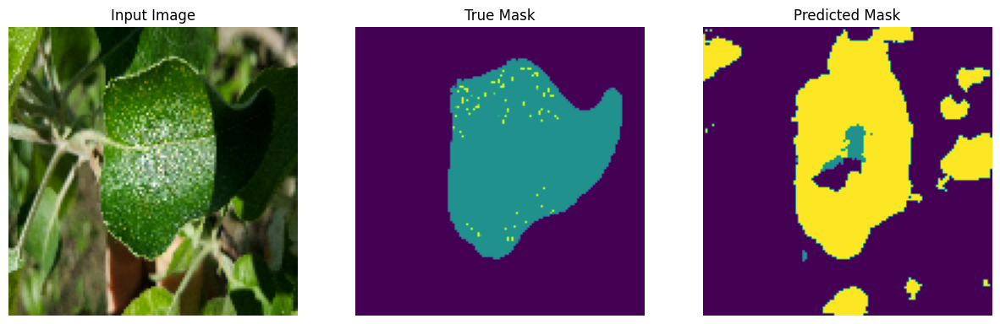

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Apple_Rust/test_Apple_Rust_1.jpg')

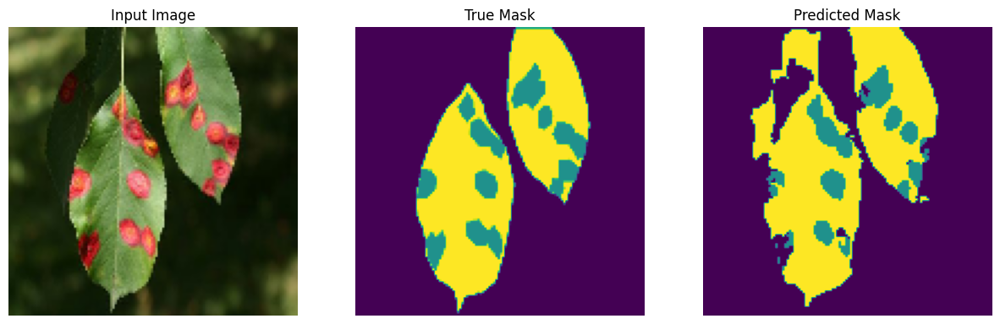

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Apple_Rust/test_Apple_Rust_10.jpg')

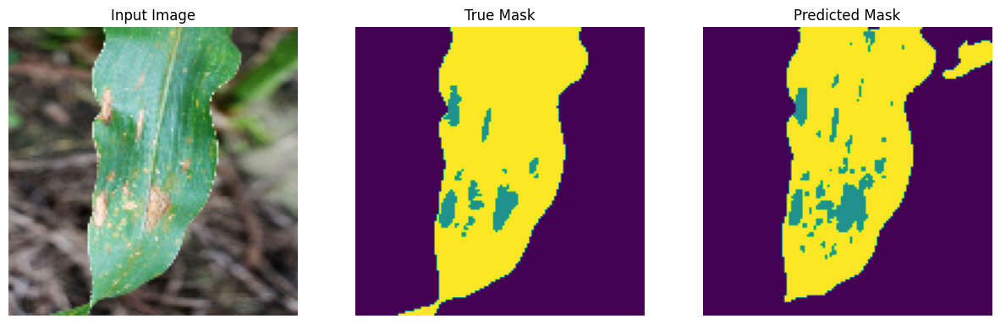

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Corn_Blight/test_Corn_Blight_10.jpg')

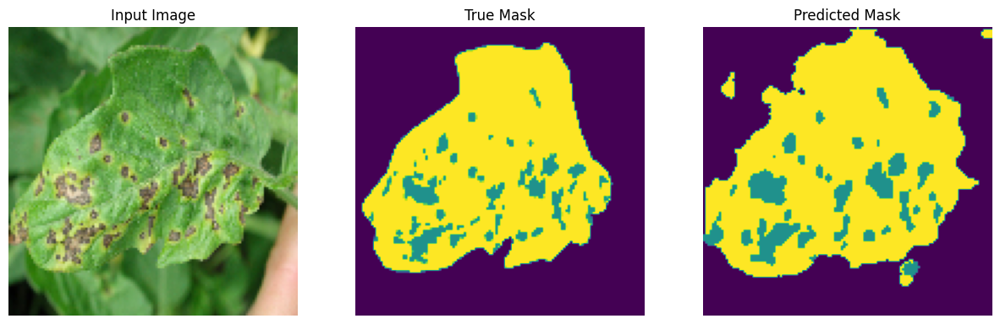

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Tomato_BacterialSpot/test_Tomato_BacterialSpot_7.jpg')

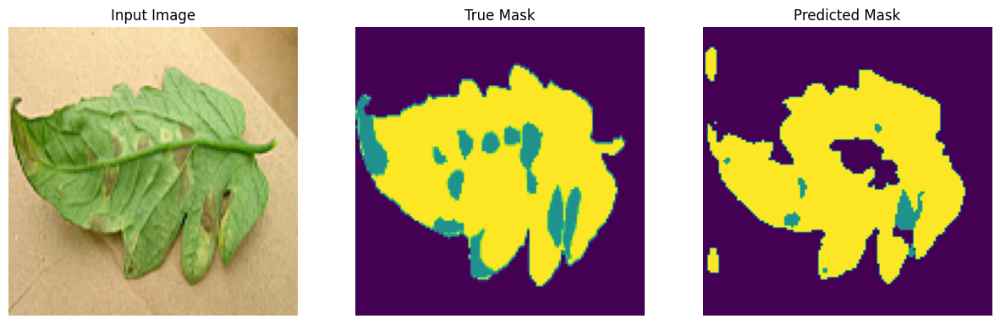

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Tomato_Mold/test_Tomato_Mold_1.jpg')

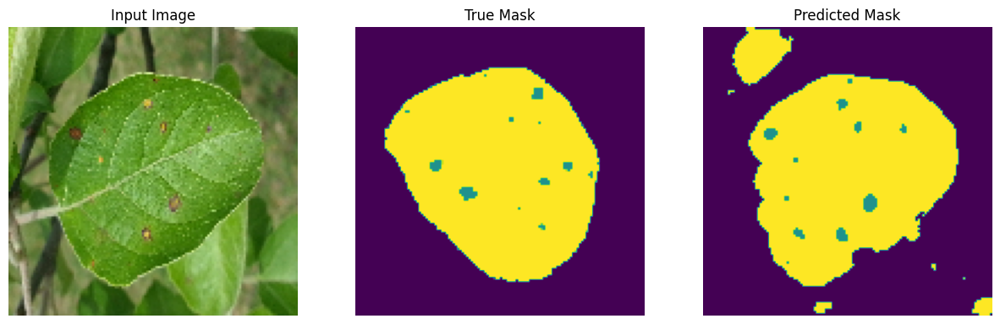

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Apple_Rust/test_Apple_Rust_6.jpg')

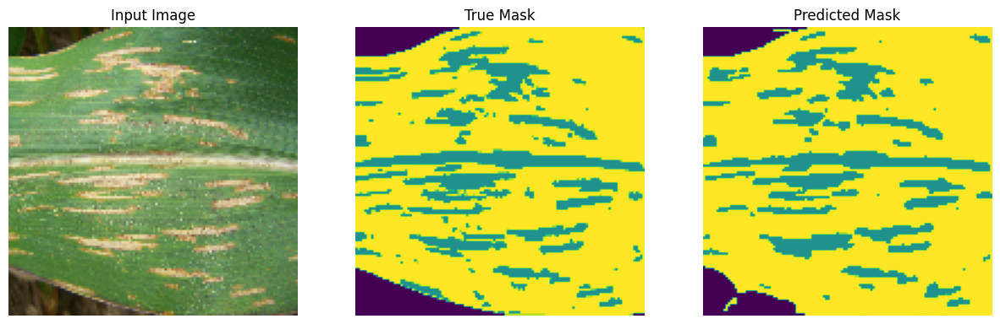

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Corn_Blight/test_Corn_Blight_11.jpg')

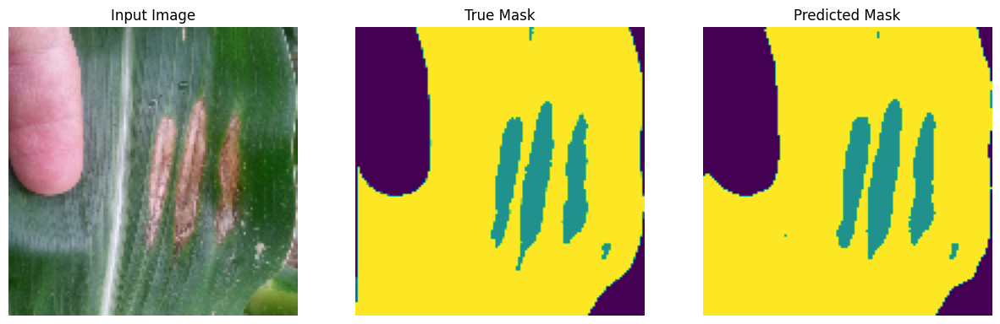

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Corn_Blight/test_Corn_Blight_8.jpg')

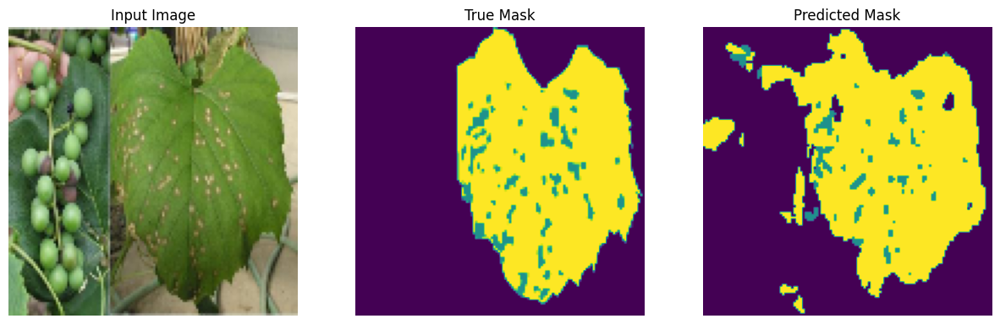

In [ ]:
# Calling the predict function
true_mask, pred_mask = predict(model,'/content/drive/MyDrive/TP_DEEP_LEARNING/Projet/original_images/original_images/test/Grape_BlackRot/test_Grape_BlackRot_1.jpg')

In [ ]:
import tensorboard
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/gradient_tape

<IPython.core.display.Javascript object>

In [ ]:
# Saving the weights of the best model
model.save_weights('/content/drive/MyDrive/PSPNet/pspnet_weights.hdf5')

# **Fonction pour calculer la moyenne IoU.**

In [ ]:
def IoU(y_i,y_pred):
    # This function calculates the mean Intersection over Union
    # Mean IoU = TP/(FN + TP + FP)
    # This list will save the IoU of all the classes
    IoUs = []
    # Defining the number of classes which the model has predicted
    n_classes = 3
    for c in range(n_classes):
        # Calculating the True Positives
        TP = np.sum((y_i == c)&(y_pred==c))
        # Calculating the False Positives
        FP = np.sum((y_i != c)&(y_pred==c))
        # Calculating the False Negatives
        FN = np.sum((y_i == c)&(y_pred!= c))
        # Calculating the IoU for the particular class
        IoU = TP/float(TP + FP + FN)
        # Printing the outputs
        # Uncomment the print statement below when you want to analyze the results for each class
        #print("class {:02.0f}: #TP={:6.0f}, #FP={:6.0f}, #FN={:5.0f}, IoU={:4.3f}".format(c,TP,FP,FN,IoU))
        # Appending the IoU to the list as it mean needs to be calculated later
        if(math.isnan(IoU)):
            IoUs.append(0)
            continue
        IoUs.append(IoU)
    # Calculating the mean
    mIoU = np.mean(IoUs)
    print("_________________")
    print("Mean IoU: {:4.3f}".format(mIoU))
    return mIoU

In [ ]:
val_paths = glob(img_val+'*/*.jpg')

# **Affichage de la moyenne IoU de chaque prédiction.**

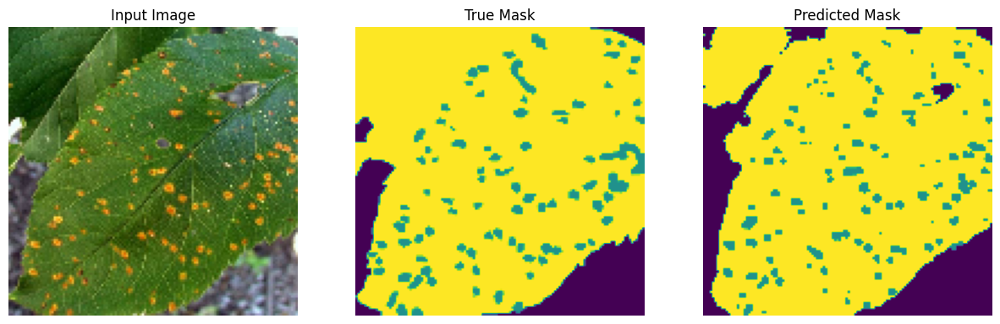

_________________
Mean IoU: 0.233


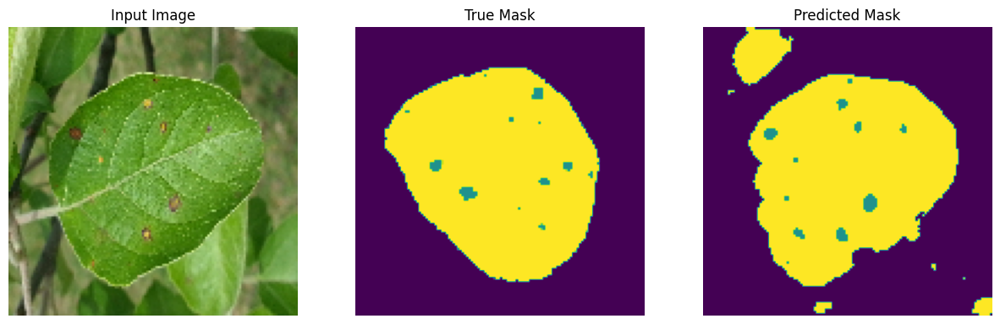

_________________
Mean IoU: 0.262


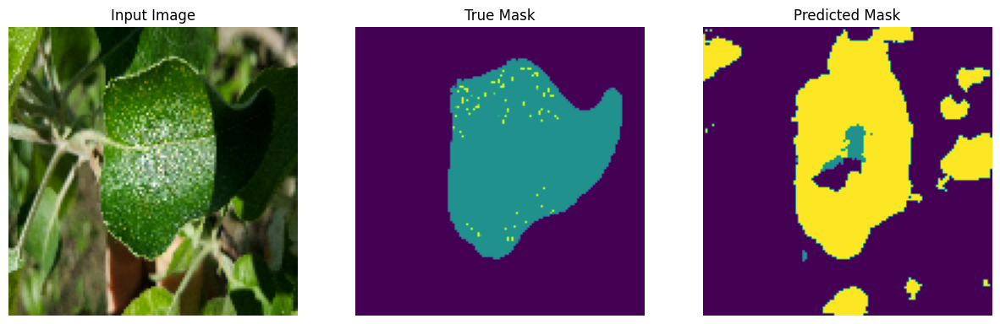

_________________
Mean IoU: 0.274


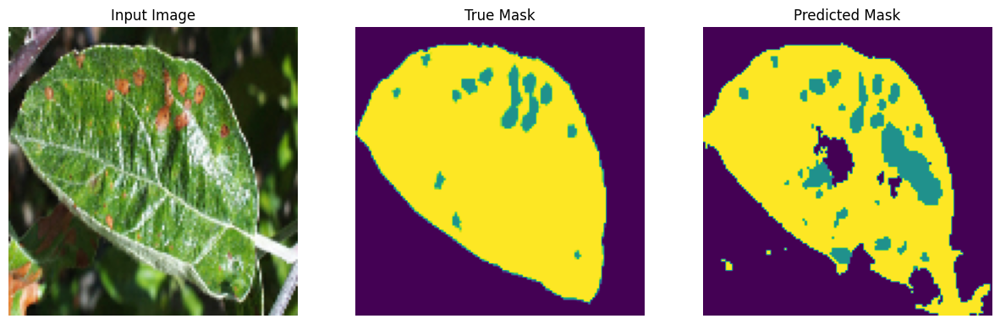

_________________
Mean IoU: 0.293


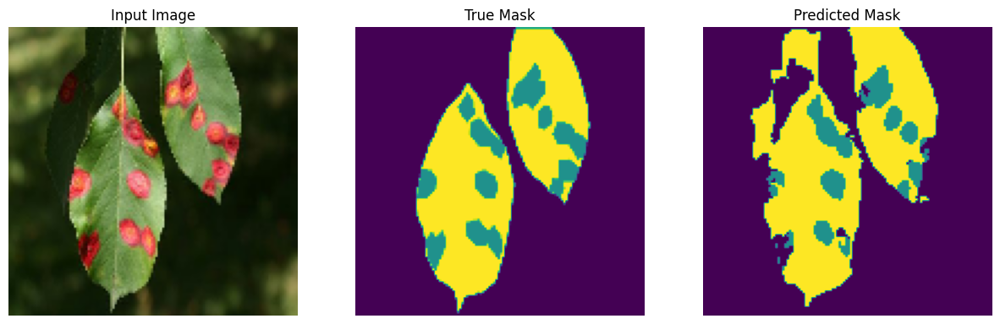

_________________
Mean IoU: 0.306


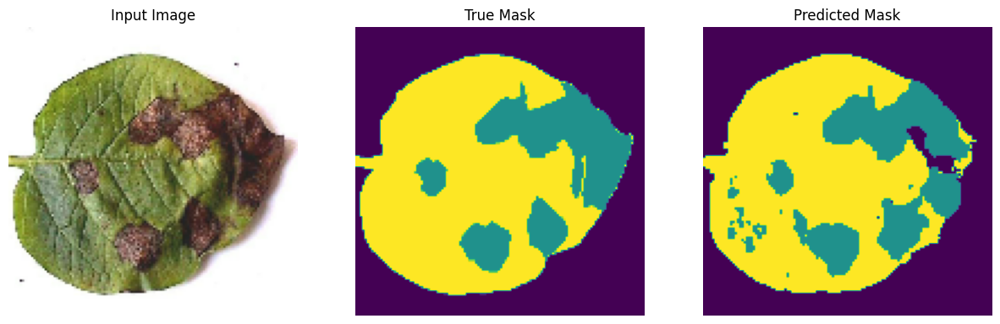

_________________
Mean IoU: 0.313


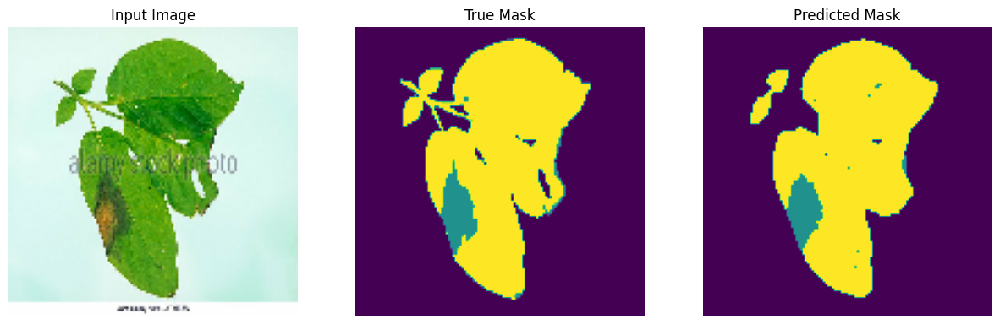

_________________
Mean IoU: 0.324


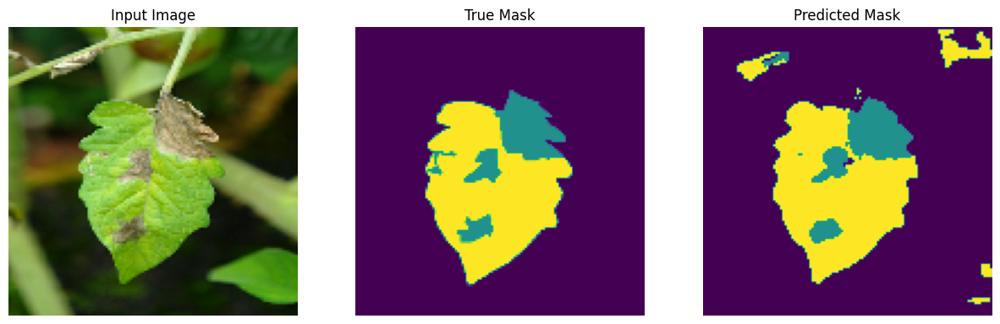

_________________
Mean IoU: 0.319


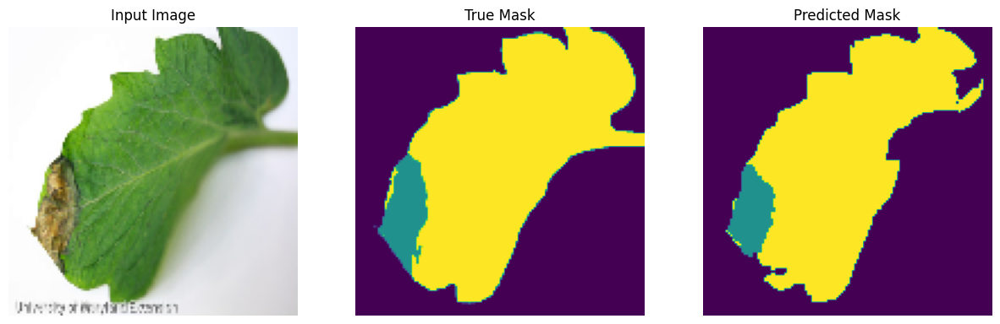

_________________
Mean IoU: 0.297


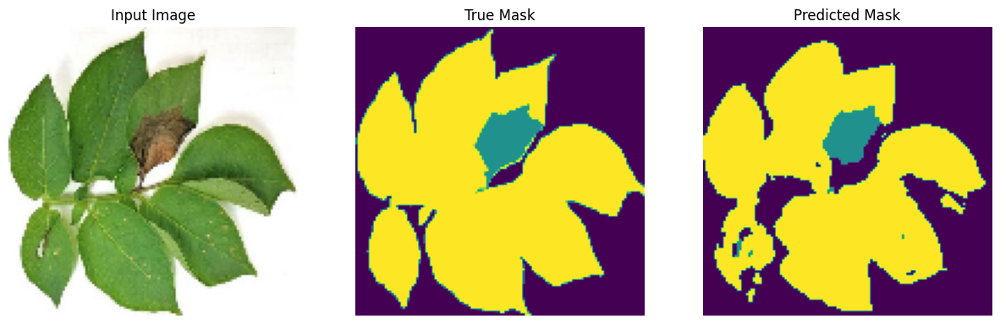

_________________
Mean IoU: 0.274


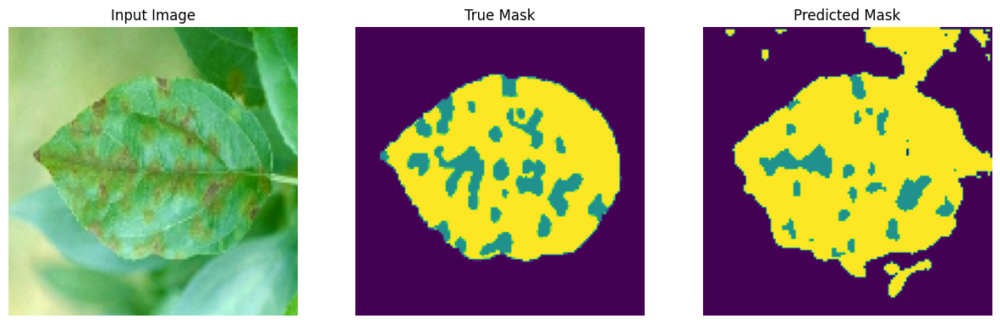

_________________
Mean IoU: 0.290


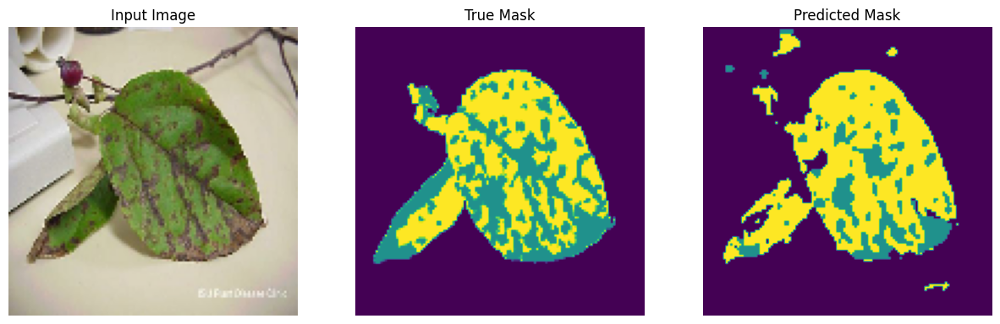

_________________
Mean IoU: 0.308


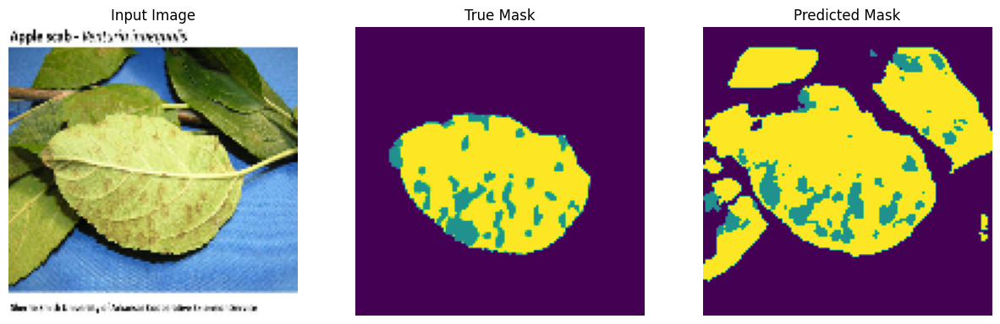

_________________
Mean IoU: 0.234


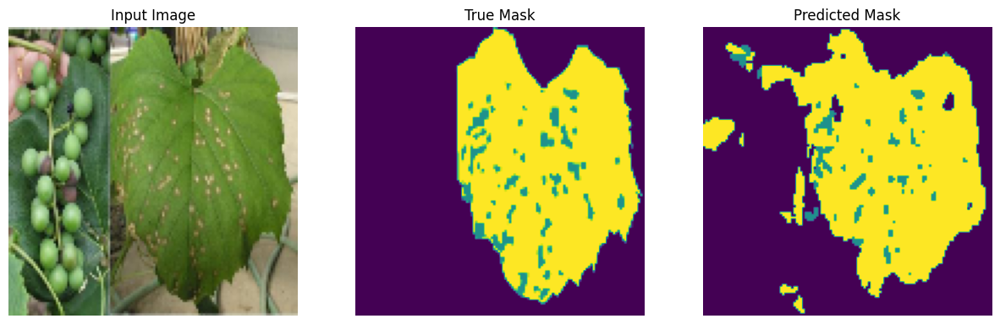

_________________
Mean IoU: 0.290


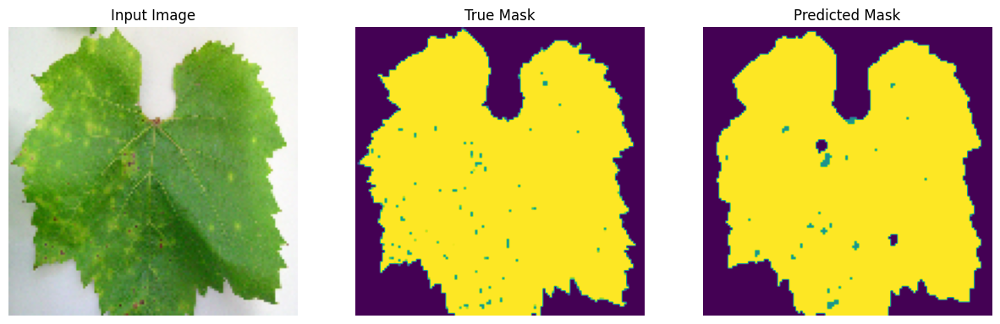

_________________
Mean IoU: 0.317


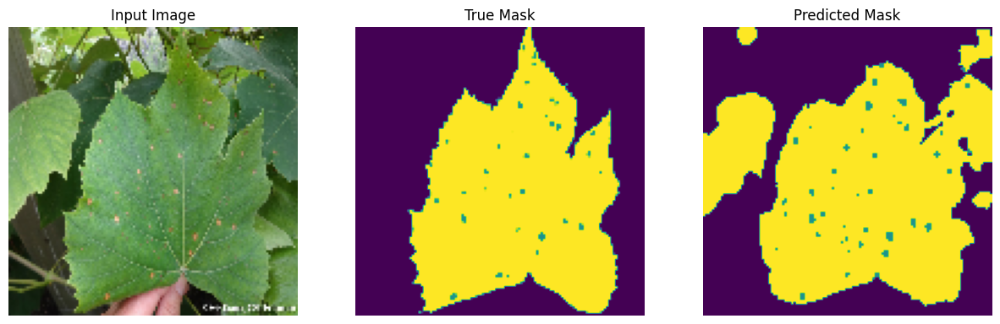

_________________
Mean IoU: 0.240


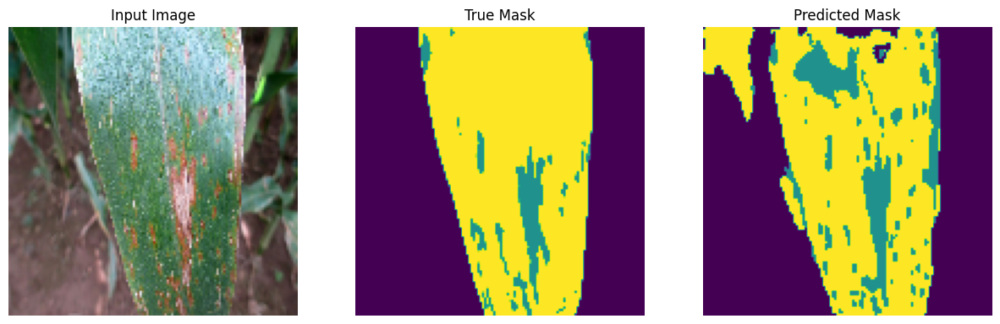

_________________
Mean IoU: 0.295


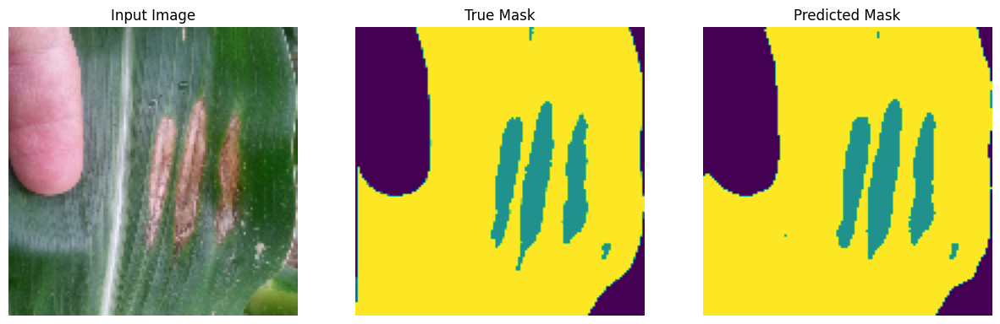

_________________
Mean IoU: 0.315


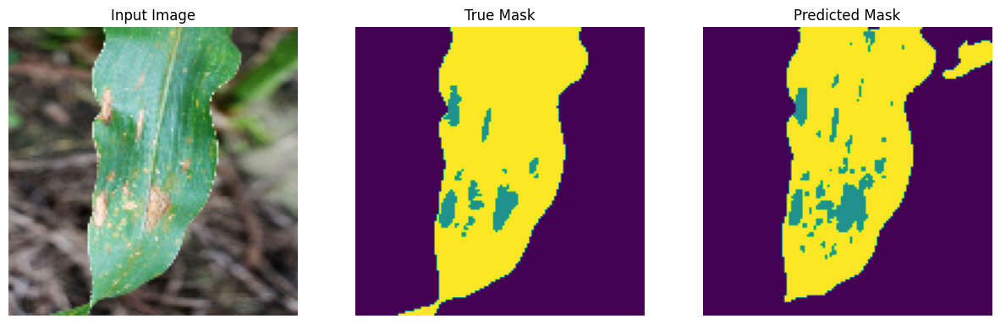

_________________
Mean IoU: 0.322


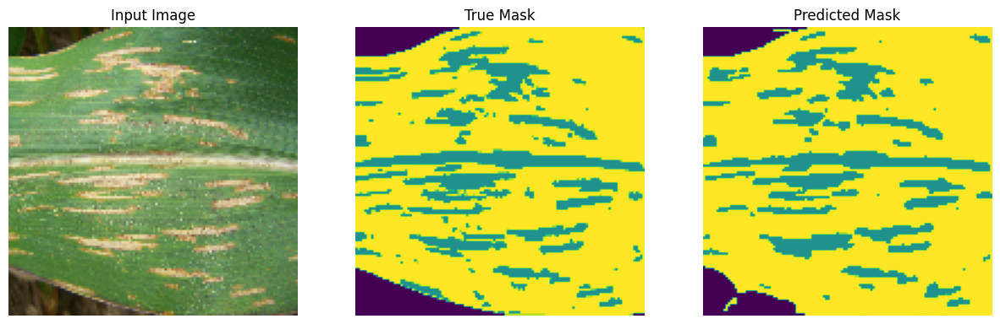

_________________
Mean IoU: 0.278


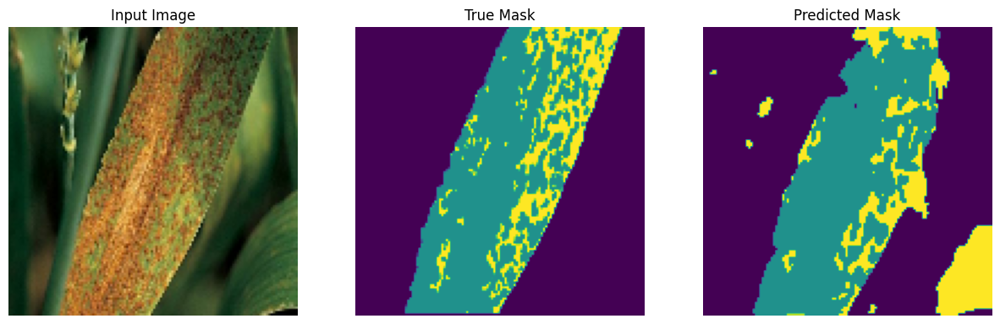

_________________
Mean IoU: 0.287


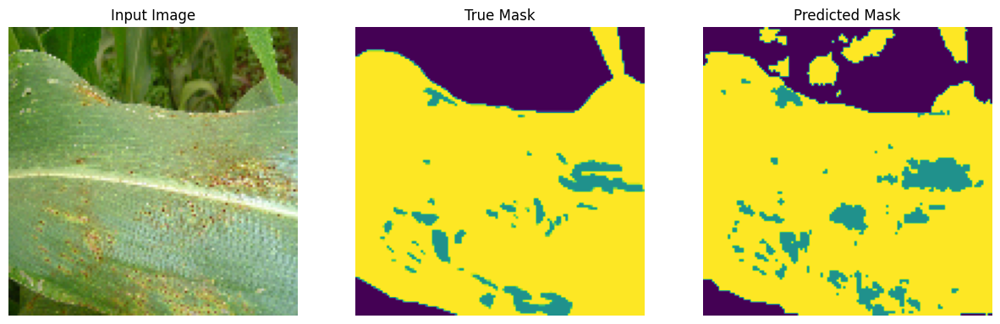

_________________
Mean IoU: 0.268


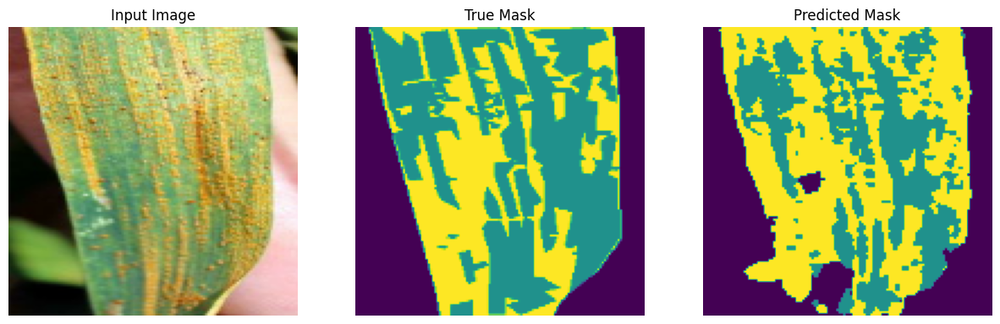

_________________
Mean IoU: 0.278


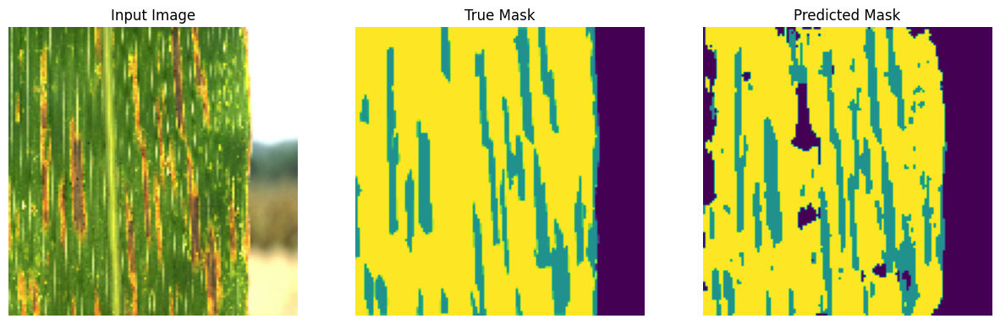

_________________
Mean IoU: 0.248


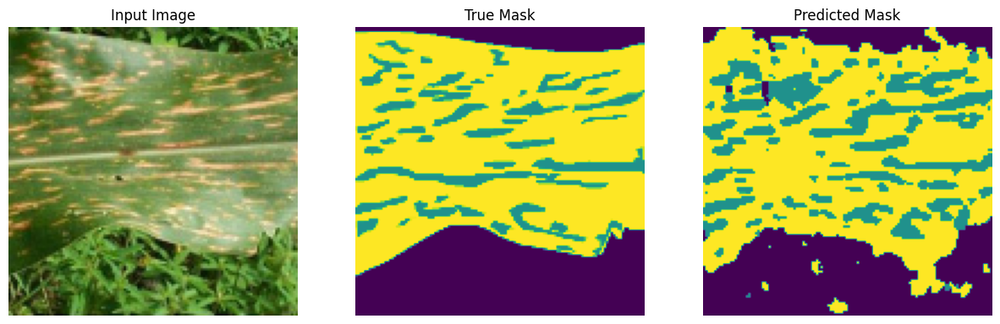

_________________
Mean IoU: 0.272


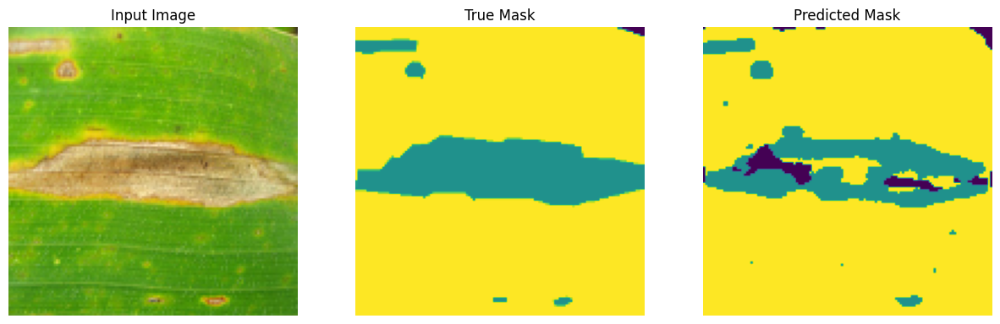

_________________
Mean IoU: 0.018


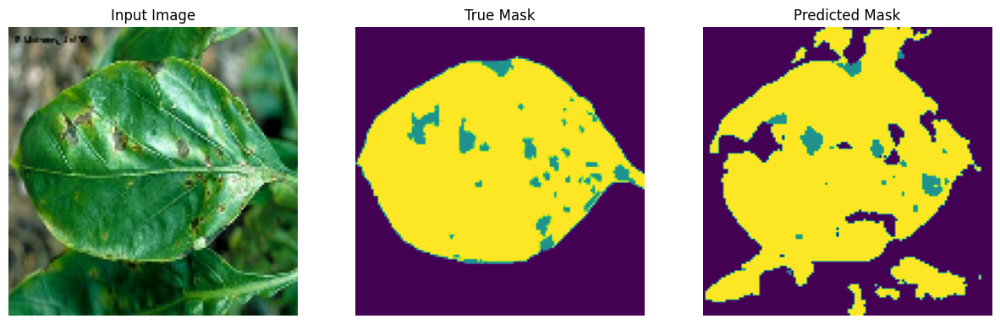

_________________
Mean IoU: 0.252


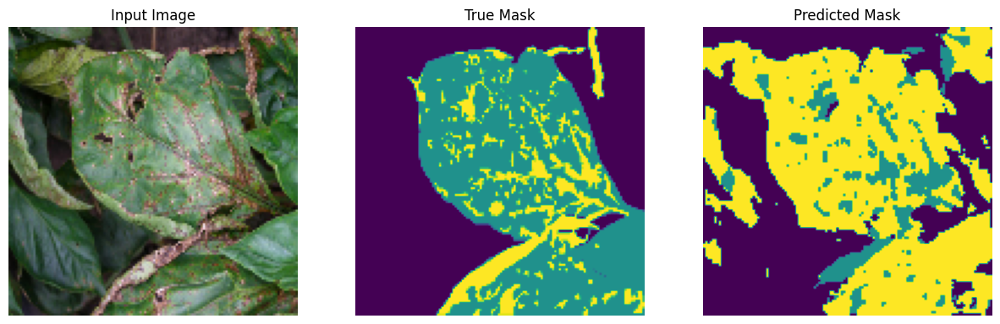

_________________
Mean IoU: 0.221


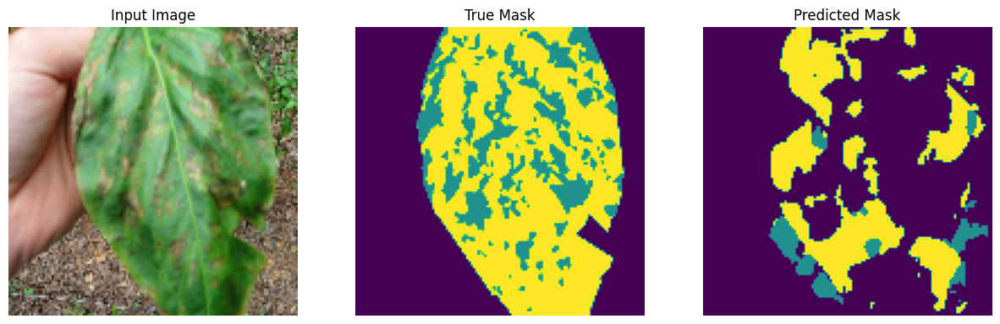

_________________
Mean IoU: 0.159


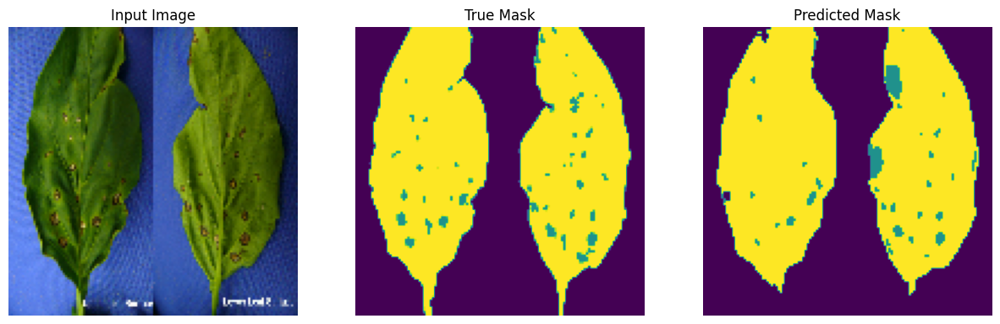

_________________
Mean IoU: 0.319


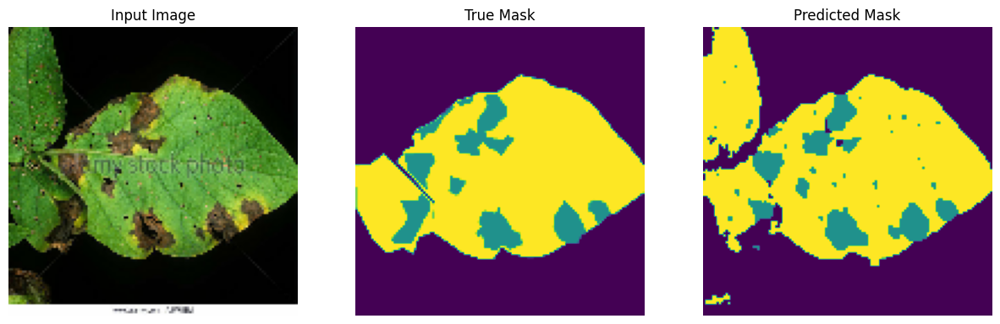

_________________
Mean IoU: 0.274


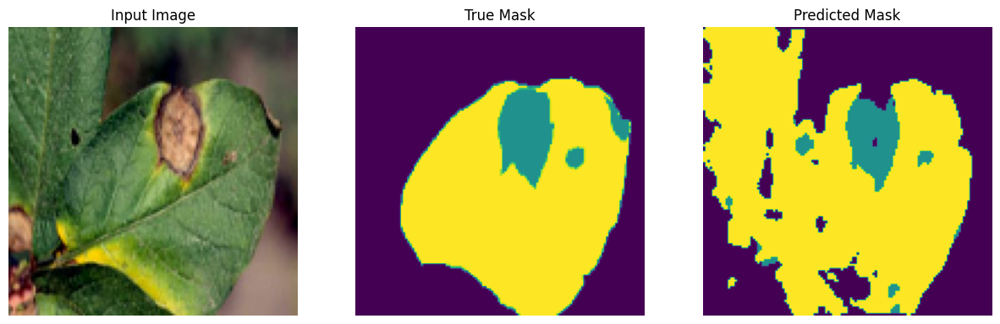

_________________
Mean IoU: 0.188


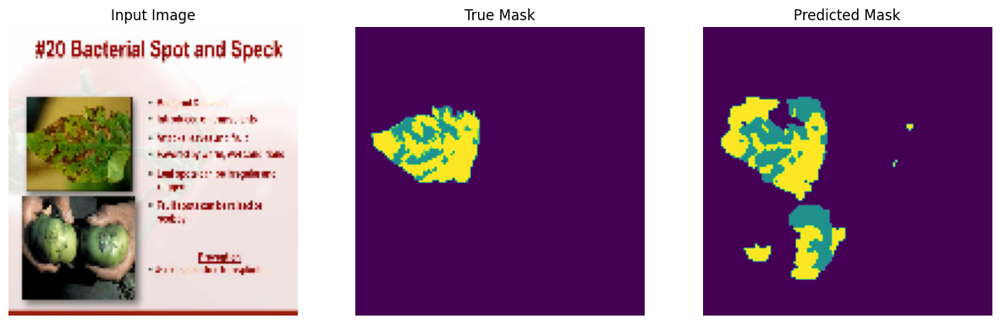

_________________
Mean IoU: 0.310


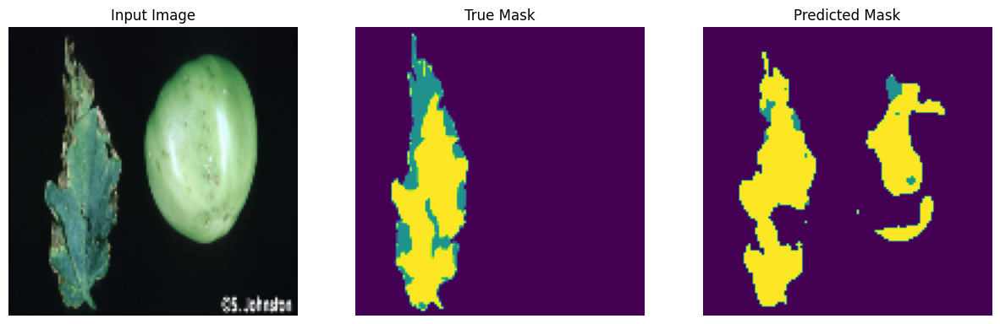

_________________
Mean IoU: 0.296


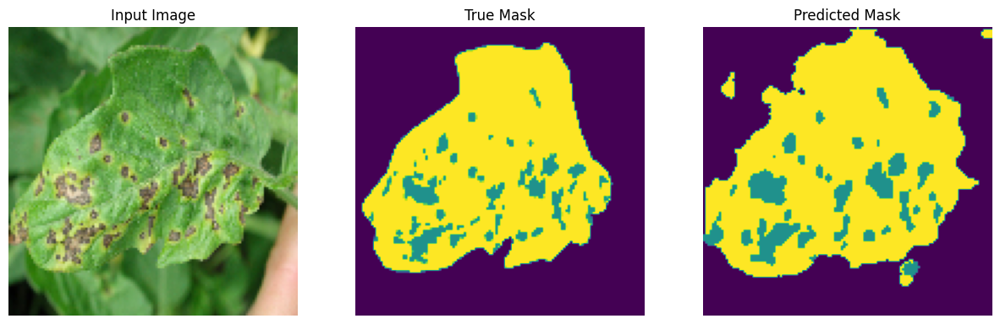

_________________
Mean IoU: 0.282


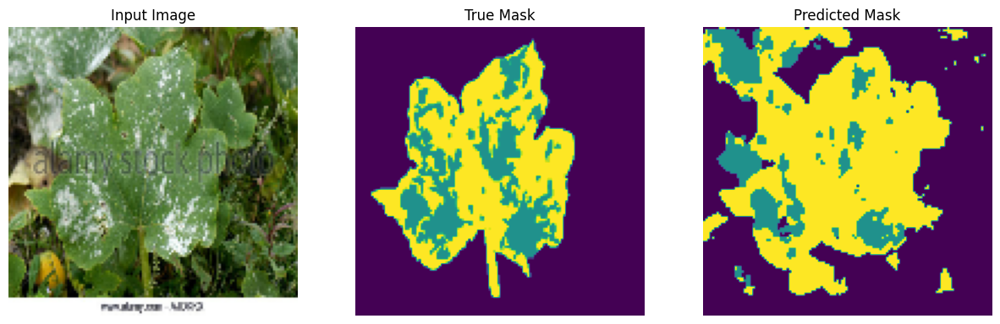

_________________
Mean IoU: 0.244


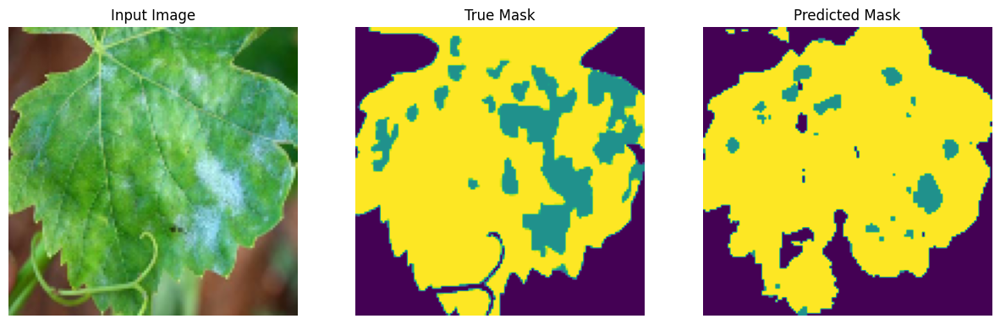

_________________
Mean IoU: 0.250


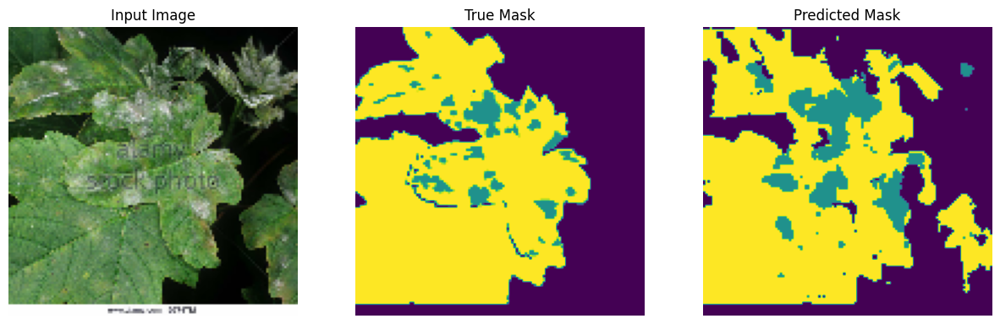

_________________
Mean IoU: 0.243


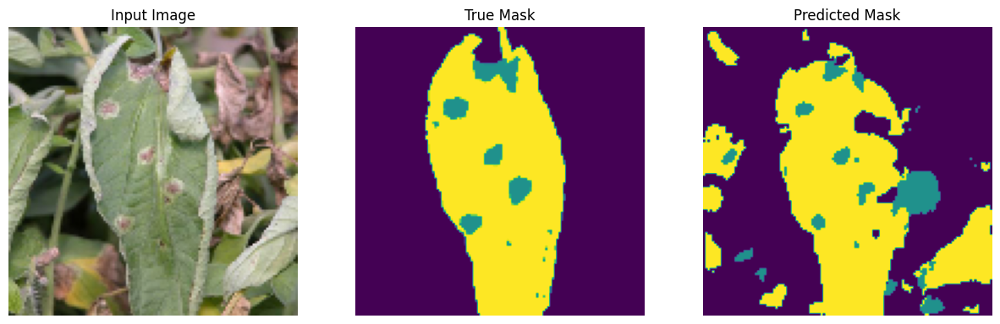

_________________
Mean IoU: 0.254


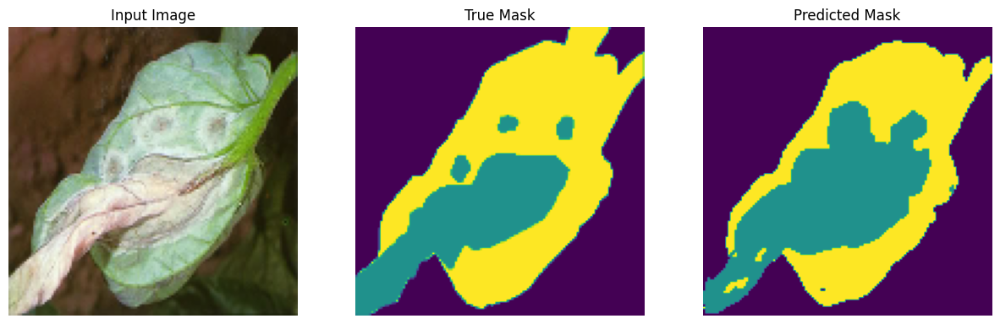

_________________
Mean IoU: 0.314


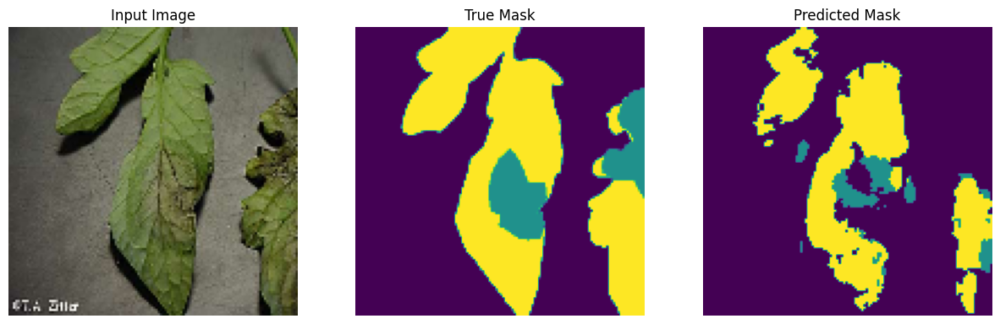

_________________
Mean IoU: 0.261


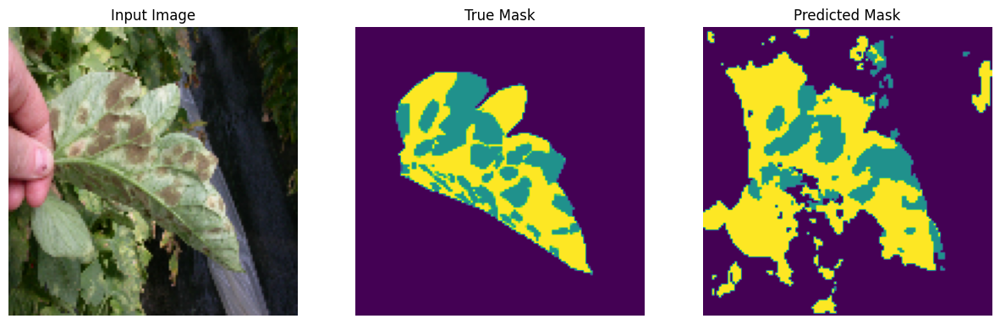

_________________
Mean IoU: 0.267


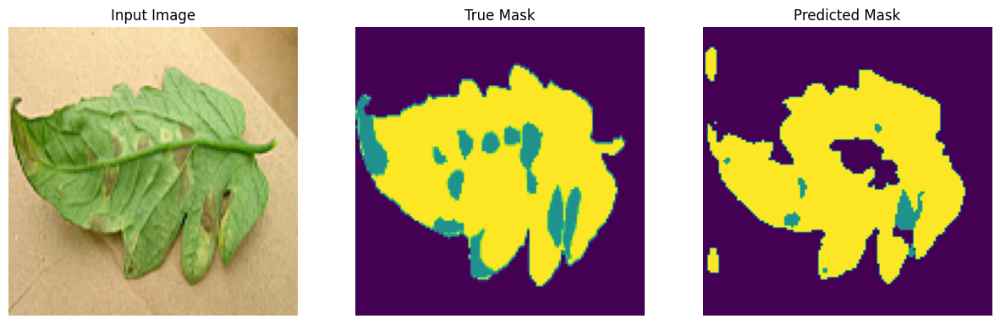

_________________
Mean IoU: 0.284


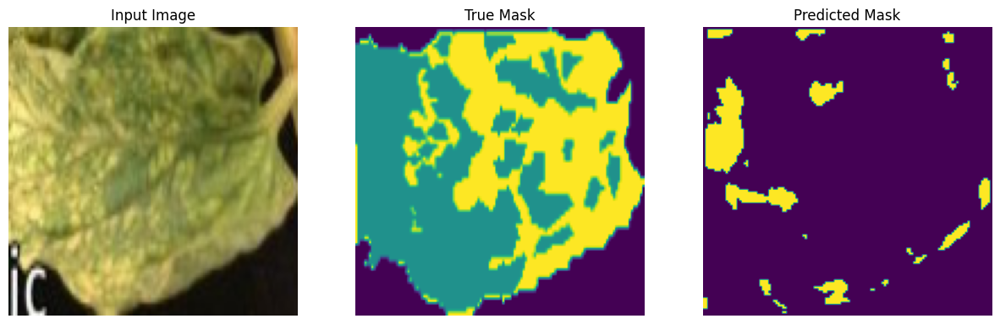

_________________
Mean IoU: 0.068


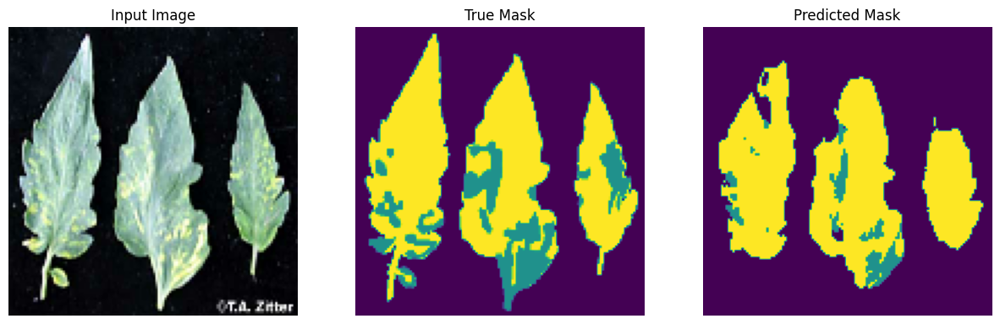

_________________
Mean IoU: 0.294


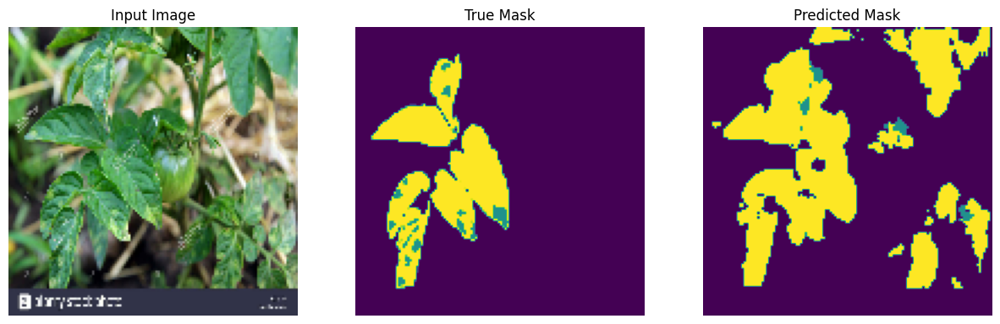

_________________
Mean IoU: 0.270


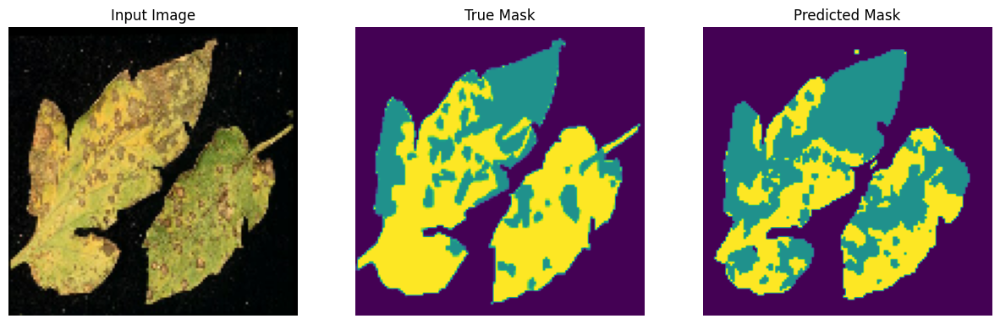

_________________
Mean IoU: 0.314


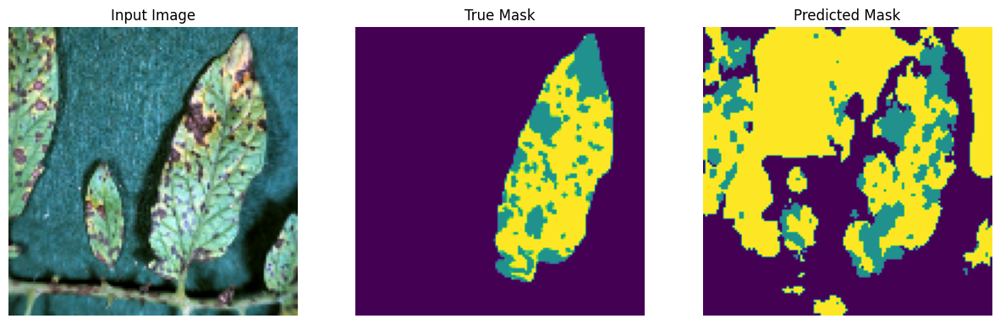

_________________
Mean IoU: 0.156


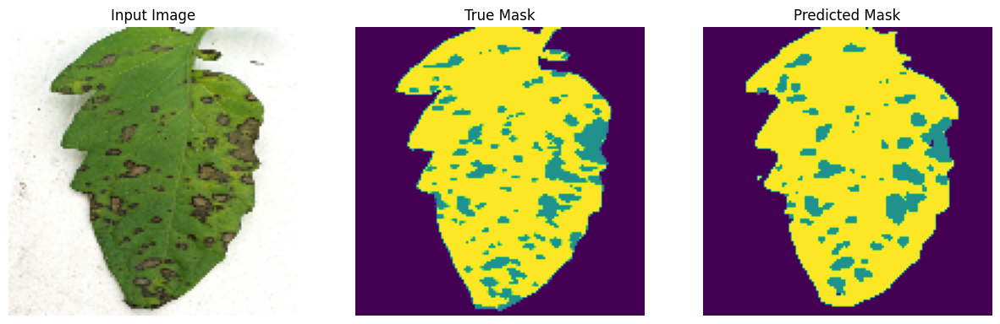

_________________
Mean IoU: 0.322


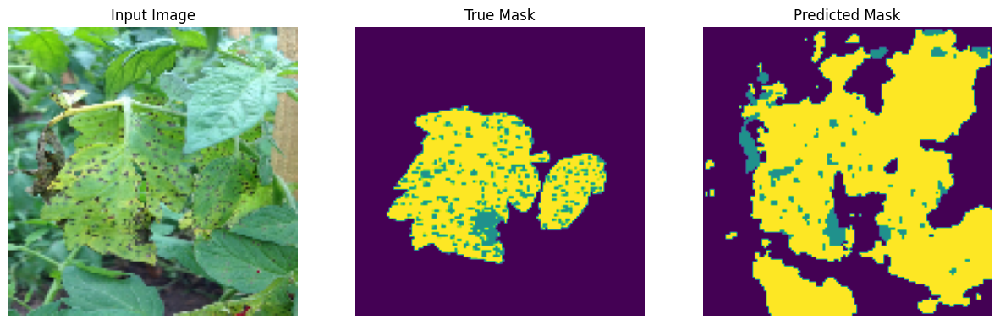

_________________
Mean IoU: 0.185


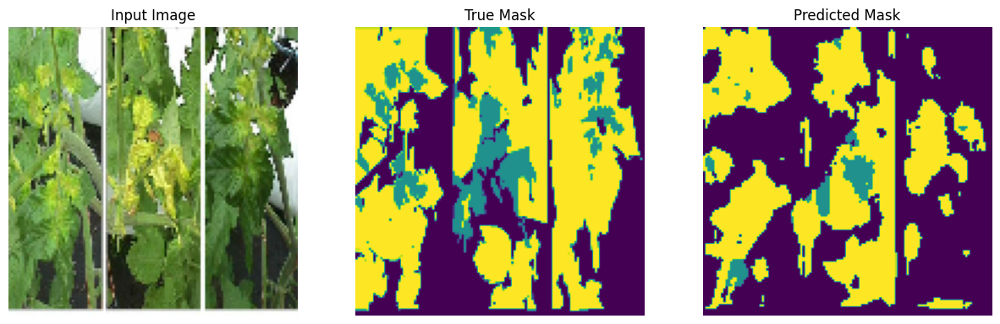

_________________
Mean IoU: 0.159


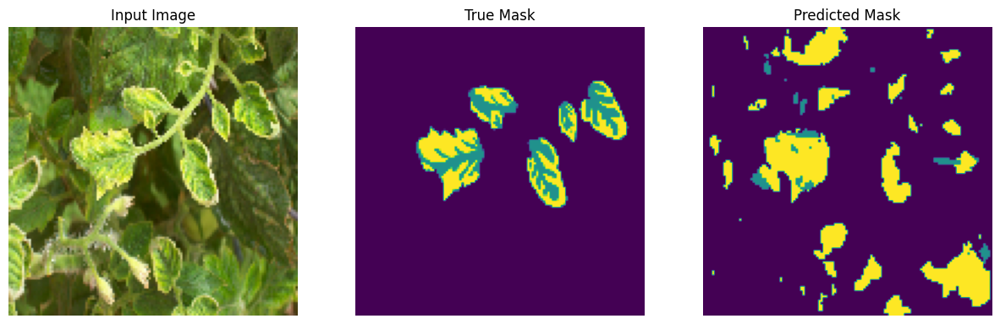

_________________
Mean IoU: 0.282


In [ ]:
mIoU = []
for path in val_paths:
    true_mask, pred_mask = predict(model,path)
    mIoU.append(IoU(true_mask, pred_mask))

# **Affichage de la moyenne IoU totale.**

In [ ]:
print("Validation mIoU = ",sum(mIoU)/len(mIoU))

Validation mIoU =  0.26199887388937804
